## Task 1: Creating a Synthetic Paired Dataset

### Objective
Generate a synthetic paired dataset using Stable Diffusion, where each pair consists of a bearded and a clean-shaven version of the same face.

### Requirements
#### 1- Dataset Specifications
- Size: At least 100 paired images
- Resolution: Each image must be at least 512x512 pixels
- Pairs must clearly represent the same individual with and without a beard
#### 2- Output Validation
Provide a preview of at least 10 paired images in the notebook to verify dataset quality and structure.

In [14]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import os
import sys
import numpy as np
import pandas as pd
from PIL import Image
import torch
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
import os
import numpy as np
import pandas as pd
import torch
from PIL import Image
import torch
import lpips
import torchvision.transforms as T
from dreamsim import dreamsim
import random
from testing.test import test_model
from util.config import load_config
from training.training_pix2pixhd import train_model
from util.generate_paired_data import main


base_dir = "dataset/train/base_image"
beard_dir = "dataset/train/beared"

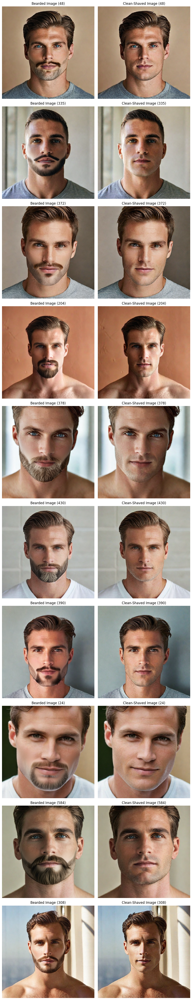

In [17]:
'''
This examples are pre-saved samples that generated while in the development phase.
'''

def plot_paired_images(base_dir, beard_dir, num_pairs=10):
    base_files = {
        f.split('_')[-1].split('.')[0]: os.path.join(base_dir, f)
        for f in os.listdir(base_dir) if f.startswith("base_image") and f.lower().endswith('.png')
    }

    beard_files = {
        f.split('_')[-1].split('.')[0]: os.path.join(beard_dir, f)
        for f in os.listdir(beard_dir) if f.startswith("inpainted_beard") and f.lower().endswith('.png')
    }

    common_ids = list(set(base_files.keys()) & set(beard_files.keys()))
    
    num = min(num_pairs, len(common_ids))
    if num == 0:
        print("No paired images found.")
        return

    selected_ids = random.sample(common_ids, num)

    fig, axs = plt.subplots(num, 2, figsize=(10, 5 * num))

    if num == 1:
        axs = [axs]

    for i, img_id in enumerate(selected_ids):
        base_img = Image.open(base_files[img_id]).convert("RGB")
        beard_img = Image.open(beard_files[img_id]).convert("RGB")

        axs[i][0].imshow(beard_img)
        axs[i][0].set_title(f"Bearded Image ({img_id})")
        axs[i][0].axis("off")

        axs[i][1].imshow(base_img)
        axs[i][1].set_title(f"Clean-Shaved Image ({img_id})")
        axs[i][1].axis("off")

    plt.tight_layout()
    plt.show()
    
plot_paired_images(base_dir, beard_dir, num_pairs=10)

#### Paired Data Generation for Facial Image Translation

To create a paired dataset for the facial image translation task (i.e., transforming bearded images to clean-shaved counterparts), we implemented a three-step pipeline:

##### 1- Base Image Generation:

- We used the RealVisXL_V5.0 model from Hugging Face’s Diffusers library to synthesize clean-shaved facial portraits. The prompt was carefully designed to generate images with a clean-shaved appearance, ensuring the subject is looking directly at the camera under natural lighting. Each generated image was saved with a standardized naming format (base_image_{index}.png) to facilitate subsequent pairing.

##### 2- Face Mask Extraction:

- To isolate the facial region associated with the beard, we implemented a custom mask extraction function using dlib. This function detects facial landmarks based on the 68-point model and constructs a polygon covering the jaw and cheek areas (landmarks 2–16) while excluding the mouth region (landmarks 49–68). The resulting binary mask is then saved using the same index as the corresponding base image, ensuring that each mask aligns with its generated portrait.

##### 3- Inpainting to Generate Bearded Variants:

- Finally, we employed a diffusion-based inpainting model (stable-diffusion-xl-1.0-inpainting-0.1) to add realistic beard features. By using the previously extracted mask, the inpainting model was guided to selectively modify the facial region, generating a paired bearded variant (inpainted_beard_{index}.png) corresponding to each clean-shaved base image. This inpainting process effectively creates a synthetic paired dataset where each clean-shaved image has a corresponding bearded version.


### Demo

Generating base images...


100%|██████████| 50/50 [00:09<00:00,  5.29it/s]


Saved base image: /media/ra-pc/ssd-raid/img2img-case-study/dataset-test/test/base_image/base_image_1.png


100%|██████████| 50/50 [00:09<00:00,  5.25it/s]


Saved base image: /media/ra-pc/ssd-raid/img2img-case-study/dataset-test/test/base_image/base_image_2.png


100%|██████████| 50/50 [00:09<00:00,  5.21it/s]


Saved base image: /media/ra-pc/ssd-raid/img2img-case-study/dataset-test/test/base_image/base_image_3.png


100%|██████████| 50/50 [00:09<00:00,  5.18it/s]


Saved base image: /media/ra-pc/ssd-raid/img2img-case-study/dataset-test/test/base_image/base_image_4.png


100%|██████████| 50/50 [00:09<00:00,  5.16it/s]


Saved base image: /media/ra-pc/ssd-raid/img2img-case-study/dataset-test/test/base_image/base_image_5.png
Base image generation complete.

Extracting masks from base images...


Extracting masks: 100%|██████████| 5/5 [00:05<00:00,  1.19s/it]


Mask extraction complete.

Performing inpainting to generate bearded variants...


100%|██████████| 49/49 [00:09<00:00,  5.23it/s]


Beard variant saved as: /media/ra-pc/ssd-raid/img2img-case-study/dataset-test/test/beared/inpainted_beard_1.png


100%|██████████| 49/49 [00:09<00:00,  5.22it/s]


Beard variant saved as: /media/ra-pc/ssd-raid/img2img-case-study/dataset-test/test/beared/inpainted_beard_2.png


100%|██████████| 49/49 [00:09<00:00,  5.21it/s]


Beard variant saved as: /media/ra-pc/ssd-raid/img2img-case-study/dataset-test/test/beared/inpainted_beard_3.png


100%|██████████| 49/49 [00:09<00:00,  5.19it/s]


Beard variant saved as: /media/ra-pc/ssd-raid/img2img-case-study/dataset-test/test/beared/inpainted_beard_4.png


100%|██████████| 49/49 [00:09<00:00,  5.18it/s]


Beard variant saved as: /media/ra-pc/ssd-raid/img2img-case-study/dataset-test/test/beared/inpainted_beard_5.png
Paired data generation complete.


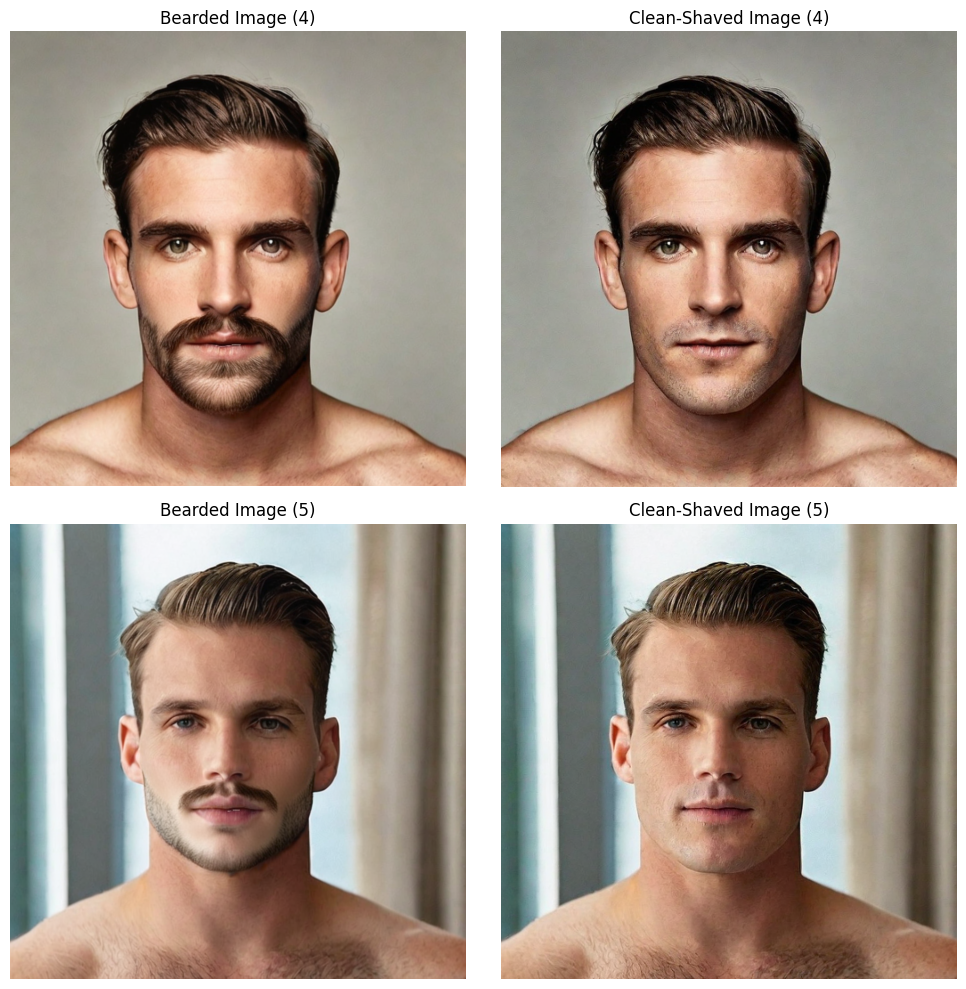

In [19]:
main(number_of_images=5)

#demo paths, will create dynamically
base_image_dir = "dataset-test/test/base_image"
beard_dir = "dataset-test/test/beared"

plot_paired_images(base_image_dir, beard_dir, num_pairs=2)

## Task 2: Training a Lightweight Image-to-Image (img2img) Model

### Objective
Train a lightweight img2img generative model to convert a bearded image into its clean-shaven counterpart using the synthetic dataset.

### Requirements
#### Model Training
- Use an appropriate lightweight architecture (e.g., U-Net, Pix2PixHD, or similar)
- Minimum training resolution: 256x256 pixels
- Optimize the training process to fit within limited resources if applicable
- The model doesn’t need to achieve perfect results but must demonstrate an effort to learn the transformation.

### Dataset Sharing

To download generated dataset for train and test split: https://drive.google.com/file/d/1seT6M7VjyI91UEqjYc0rr_Zs1GyeqCnZ/view?usp=sharing

# Training a Lightweight Image-to-Image (img2img) Model

## Overview

In this work, we train a lightweight image-to-image translation model to convert bearded images into their clean-shaved counterparts. Our goal is not to achieve state-of-the-art results but rather to demonstrate that even with limited data and resources (approximately 700 paired samples), the model can learn the transformation. We base our approach on conditional GAN frameworks like Pix2PixHD while simplifying and adapting the architecture for our specific use-case.

## Our Approach

### Model Architecture

- **Generator:**  
  - We employ a simplified version of the Pix2PixHD generator based on a U-Net style architecture with ResNet blocks.
  
- **Discriminator:**  
  - We use a single PatchGAN discriminator that evaluates local patches to determine if an image is real or fake.
  - *Note:* Unlike the original Pix2PixHD, which uses multiple discriminators (global and local), our approach utilizes a single discriminator to reduce computational complexity.

### Loss Functions

- **Adversarial Loss (LSGAN):**  
  - We use a least-squares GAN loss (MSE) to encourage the generator to produce outputs that the discriminator classifies as real.
  
- **L1 Reconstruction Loss:**  
  - An L1 loss is applied between the generated image and the ground truth clean-shaved image. This loss is heavily weighted (e.g., 100×) to enforce pixel-level similarity.

### Training Strategy

- **Data Preprocessing:**  
  - Images are resized to 256×256 pixels and normalized using dataset-specific statistics.
  
- **Learning Rate Scheduling:**  
  - A StepLR scheduler decays the learning rate every 30 epochs by a factor of 0.5.
  
- **Multi-GPU Training:**  
  - To efficiently utilize available hardware, we leverage DataParallel across two GPUs.

In [ ]:
config = load_config("config.yaml")
train_model(config)

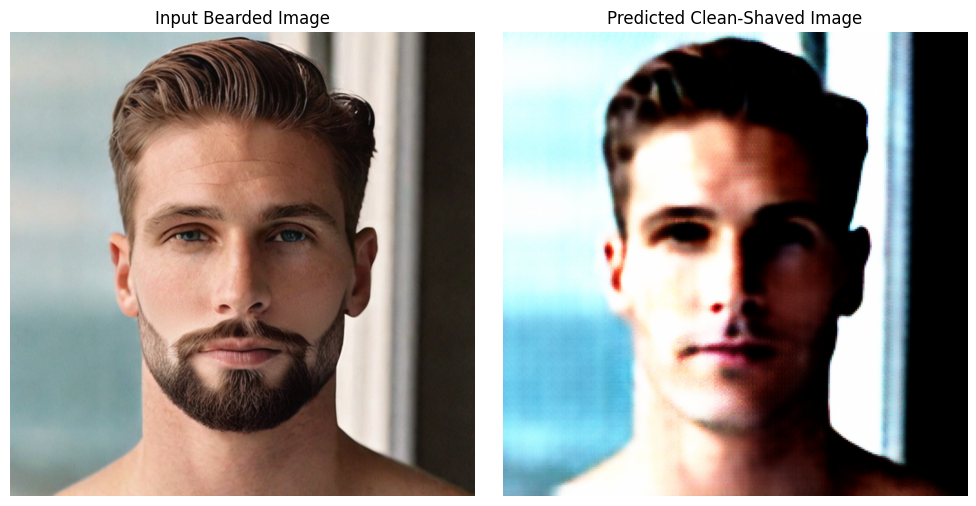

In [20]:
input_image = "dataset/test/beared/inpainted_beard_5.png"
checkpoint = "checkpoints/experiment_2/netG_epoch_100.pth"
output_image = "outputs/test_output.png"

test_model(input_image, checkpoint, output_image, device="cuda", visualize=True)

## Quantative Evaluation Table

### Ablation Study 1: Training Pix2PixHD with Adversial Loss + L1 Loss (Reconstruction Loss)

In [21]:
gt_dir = "dataset/test/beared" 
output_dir = "outputs/experiment_1/"          
checkpoint = "checkpoints/experiment_1/netG_epoch_80.pth"

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
gt_files = sorted([f for f in os.listdir(gt_dir) if f.lower().endswith('.png')])
for f in gt_files:
    input_image_path = os.path.join(gt_dir, f)
    output_image_path = os.path.join(output_dir, f)
    try:
        test_model(input_image_path, checkpoint, output_image_path, device=device, visualize=False)
        print(f"Processed: {f}")
    except Exception as e:
        print(f"Error processing {f}: {e}")

In [22]:
def evaluate_images(gt_dir, output_dir, target_size=(256,256), win_size=7, device='cuda'):

    lpips_fn = lpips.LPIPS(net='alex').to(device)


    dreamsim_fn, preporcess = dreamsim(pretrained=True, device=device)

    eval_transform = T.Compose([
        T.Resize(target_size),
        T.ToTensor(), 
        T.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  
    ])

    metrics = []
    files = sorted([f for f in os.listdir(gt_dir) if f.lower().endswith('.png')])

    psnr_vals, ssim_vals, lpips_vals, dreamsim_vals = [], [], [], []

    for filename in files:
        gt_path = os.path.join(gt_dir, filename)
        out_path = os.path.join(output_dir, filename)

        if not os.path.exists(out_path):
            print(f"Output file for {filename} not found, skipping.")
            continue

        gt_img_pil = Image.open(gt_path).convert("RGB").resize(target_size, Image.LANCZOS)
        out_img_pil = Image.open(out_path).convert("RGB").resize(target_size, Image.LANCZOS)

        gt_np = np.array(gt_img_pil, dtype=np.float32) / 255.0
        out_np = np.array(out_img_pil, dtype=np.float32) / 255.0

   
        psnr_val = peak_signal_noise_ratio(gt_np, out_np, data_range=1.0)
        psnr_vals.append(psnr_val)

      
        ssim_val = structural_similarity(gt_np, out_np, channel_axis=-1, data_range=1.0, win_size=win_size)
        ssim_vals.append(ssim_val)

       
        gt_tensor = eval_transform(gt_img_pil).unsqueeze(0).to(device)   
        out_tensor = eval_transform(out_img_pil).unsqueeze(0).to(device) 

        gt_dreamsim_tensor = preporcess(gt_img_pil).to(device)
        out_dreamsim_tensor = preporcess(out_img_pil).to(device)

        with torch.no_grad():
            lpips_val = lpips_fn(gt_tensor, out_tensor).item()
            dreamsim_distance = dreamsim_fn(gt_dreamsim_tensor, out_dreamsim_tensor).item()

        lpips_vals.append(lpips_val)
        dreamsim_vals.append(dreamsim_distance)

        metrics.append({
            "Filename": filename,
            "PSNR": psnr_val,
            "SSIM": ssim_val,
            "LPIPS": lpips_val,
            "DreamSim": dreamsim_distance
        })

   
    mean_psnr = np.mean(psnr_vals) if len(psnr_vals) > 0 else float('nan')
    mean_ssim = np.mean(ssim_vals) if len(ssim_vals) > 0 else float('nan')
    mean_lpips = np.mean(lpips_vals) if len(lpips_vals) > 0 else float('nan')
    mean_dreamsim = np.mean(dreamsim_vals) if len(dreamsim_vals) > 0 else float('nan')

    print(f"Mean PSNR:       {mean_psnr:.4f}")
    print(f"Mean SSIM:       {mean_ssim:.4f}")
    print(f"Mean LPIPS:      {mean_lpips:.4f}")   # lower is more similar
    print(f"Mean DreamSim:   {mean_dreamsim:.4f}")  # lower is more similar

    return pd.DataFrame(metrics)

df_metrics = evaluate_images(gt_dir, output_dir)
df_metrics

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/media/ra-pc/ssd-raid/miniconda3/envs/deliver/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/media/ra-pc/ssd-raid/miniconda3/envs/deliver/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to ./models/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:02<00:00, 116MB/s]  


Loading model from: /media/ra-pc/ssd-raid/miniconda3/envs/deliver/lib/python3.10/site-packages/lpips/weights/v0.1/alex.pth


100%|██████████| 1.17G/1.17G [00:52<00:00, 24.0MB/s]


Unzipping...


Downloading: "https://github.com/facebookresearch/dino/zipball/main" to ./models/main.zip
Downloading: "https://dl.fbaipublicfiles.com/dino/dino_vitbase16_pretrain/dino_vitbase16_pretrain.pth" to ./models/checkpoints/dino_vitbase16_pretrain.pth
100%|██████████| 327M/327M [00:02<00:00, 116MB/s]  
/media/ra-pc/ssd-raid/miniconda3/envs/deliver/lib/python3.10/site-packages/torch/nn/utils/weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)
2025-02-21 14:57:21,863 INFO: Already found a `peft_config` attribute in the model. This will lead to having multiple adapters in the model. Make sure to know what you are doing!


Mean PSNR:       13.4673
Mean SSIM:       0.5260
Mean LPIPS:      0.3656
Mean DreamSim:   0.2742


,Filename,PSNR,SSIM,LPIPS,DreamSim
0,inpainted_beard_1.png,13.625947,0.461835,0.449351,0.259971
1,inpainted_beard_10.png,13.018577,0.356878,0.402611,0.258158
2,inpainted_beard_11.png,13.672764,0.585471,0.458769,0.319861
3,inpainted_beard_12.png,12.700703,0.611918,0.347374,0.238319
4,inpainted_beard_13.png,12.008870,0.601831,0.338560,0.297909
5,inpainted_beard_14.png,15.431559,0.514278,0.264950,0.184883
6,inpainted_beard_15.png,13.852827,0.550319,0.364719,0.291815
7,inpainted_beard_16.png,13.293609,0.552707,0.400696,0.275800
8,inpainted_beard_17.png,13.619869,0.541232,0.325076,0.297115
9,inpainted_beard_18.png,13.400950,0.386427,0.441017,0.272563


### Ablation Study 2: Training Pix2PixHD with Adversial Loss + L1 Loss (Reconstruction Loss) + Perceptual Loss (Feature Matching Loss)

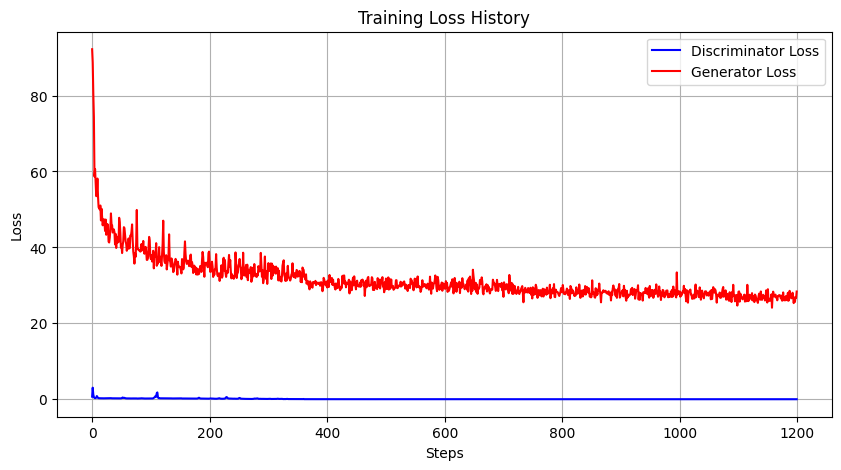

In [13]:
# Load loss history
loss_history_path = "checkpoints/experiment_2/loss_history.pth"
loss_history = torch.load(loss_history_path)

# Ensure the loss values are concatenated into a single array
loss_D = [loss for sublist in loss_history["loss_D"] for loss in sublist]  # Flatten the list
loss_G = [loss for sublist in loss_history["loss_G"] for loss in sublist]  # Flatten the list

# Create the plot
plt.figure(figsize=(10, 5))
plt.plot(loss_D, color="blue", label="Discriminator Loss")
plt.plot(loss_G, color="red", label="Generator Loss")

# Show only one label per loss type
plt.legend(loc="upper right")

plt.xlabel("Steps")
plt.ylabel("Loss")
plt.title("Training Loss History")
plt.grid(True)
plt.show()

- Multiple terms (GAN + L1 + perceptual), the initial value can be quite large. At the beginning, the generated images are far from the clean-shaven ground truth, so both L1 and perceptual differences are large, and the adversarial term is also high.
- The discriminator becomes confident in differentiating real vs. generated images, especially early on, and the generator is mostly being guided by the reconstruction (L1) + perceptual losses to refine details.
- GAN + L1 + Perceptual training curve indicates the model is learning effectively.

In [ ]:
output_dir = "outputs/experiment_2"          
checkpoint = "checkpoints/experiment_2/netG_epoch_100.pth"

device = "cuda" if torch.cuda.is_available() else "cpu"
gt_files = sorted([f for f in os.listdir(gt_dir) if f.lower().endswith('.png')])
for f in gt_files:
    input_image_path = os.path.join(gt_dir, f)
    
    output_image_path = os.path.join(output_dir, f)
    try:
        test_model(input_image_path, checkpoint, output_image_path, device=device, visualize=False)
        print(f"Processed: {f}")
    except Exception as e:
        print(f"Error processing {f}: {e}")

In [12]:
df_metrics = evaluate_images(gt_dir, output_dir)
df_metrics

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/media/ra-pc/ssd-raid/miniconda3/envs/deliver/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/media/ra-pc/ssd-raid/miniconda3/envs/deliver/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /media/ra-pc/ssd-raid/miniconda3/envs/deliver/lib/python3.10/site-packages/lpips/weights/v0.1/alex.pth
Using cached ./models


Using cache found in ./models/facebookresearch_dino_main
/media/ra-pc/ssd-raid/miniconda3/envs/deliver/lib/python3.10/site-packages/torch/nn/utils/weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)
2025-02-21 14:22:01,248 INFO: Already found a `peft_config` attribute in the model. This will lead to having multiple adapters in the model. Make sure to know what you are doing!


Mean PSNR:       13.5315
Mean SSIM:       0.5318
Mean LPIPS:      0.3530
Mean DreamSim:   0.2708


,Filename,PSNR,SSIM,LPIPS,DreamSim
0,inpainted_beard_1.png,13.492502,0.458304,0.437704,0.268159
1,inpainted_beard_10.png,12.942640,0.354789,0.396870,0.256172
2,inpainted_beard_11.png,14.076242,0.606371,0.427863,0.304748
3,inpainted_beard_12.png,12.625963,0.606410,0.336080,0.236884
4,inpainted_beard_13.png,12.167727,0.597838,0.320963,0.292785
5,inpainted_beard_14.png,15.233997,0.510611,0.256956,0.221634
6,inpainted_beard_15.png,13.789025,0.555571,0.367632,0.281470
7,inpainted_beard_16.png,13.486342,0.572784,0.374374,0.258488
8,inpainted_beard_17.png,14.196232,0.570926,0.303373,0.289130
9,inpainted_beard_18.png,13.302870,0.381662,0.444933,0.259054
